In [208]:
# Importing required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import linear_model, metrics
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

import warnings
warnings.filterwarnings('ignore')

In [209]:
# data import from csv file
df = pd.read_csv("train (1).csv")

In [210]:
# read top rows of the dataframe by func head
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [211]:
# no. of (rows, columns) in dataframe
df.shape

(1460, 81)

In [212]:
# column containing no. of null values
df.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [213]:
# Dtype and count of non_null values in repective columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [214]:
# describing the columns of dataframe
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [215]:
# analyze duplicate values
df[df.duplicated()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [216]:
# insert a new variable for information of nan values
df_nan = df [df.columns [df.isna().any ()]]

In [217]:
# convet the count of nan values of column into percent
df_nan.isnull().sum() * 100 / df.shape[0]

LotFrontage     17.739726
Alley           93.767123
MasVnrType       0.547945
MasVnrArea       0.547945
BsmtQual         2.534247
BsmtCond         2.534247
BsmtExposure     2.602740
BsmtFinType1     2.534247
BsmtFinType2     2.602740
Electrical       0.068493
FireplaceQu     47.260274
GarageType       5.547945
GarageYrBlt      5.547945
GarageFinish     5.547945
GarageQual       5.547945
GarageCond       5.547945
PoolQC          99.520548
Fence           80.753425
MiscFeature     96.301370
dtype: float64

In [218]:
# 'LotFrontage', 'Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature' has percent more than 10%

In [219]:
# drop the columns having high percent of null values and Id column as it is of no use by creating new variable
col_del = ['Id','LotFrontage', 'Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']

In [220]:
# dropping col_del
df.drop(col_del, axis=1, inplace=True)
df.shape

(1460, 74)

In [221]:
# describing the columns of dataframe
df.describe()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [222]:
# data with same value > 90% leads to miss leading and affects the normal distribution
thresold = 1460*0.9
thresold

1314.0

In [223]:
# list of column having same values more than 90%
list_del = []

for column in df:
    if df[column].value_counts().max()>= thresold:
        list_del.append(column)
print(list_del)

['Street', 'Utilities', 'LandSlope', 'Condition2', 'RoofMatl', 'Heating', 'CentralAir', 'Electrical', 'LowQualFinSF', 'BsmtHalfBath', 'KitchenAbvGr', 'Functional', 'GarageCond', 'PavedDrive', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']


In [224]:
# dropping the variable
df = df.drop(list_del, axis=1)
df

,MSSubClass,MSZoning,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,...,GarageArea,GarageQual,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,8450,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,...,548,TA,0,61,0,2,2008,WD,Normal,208500
1,20,RL,9600,Reg,Lvl,FR2,Veenker,Feedr,1Fam,1Story,...,460,TA,298,0,0,5,2007,WD,Normal,181500
2,60,RL,11250,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,...,608,TA,0,42,0,9,2008,WD,Normal,223500
3,70,RL,9550,IR1,Lvl,Corner,Crawfor,Norm,1Fam,2Story,...,642,TA,0,35,272,2,2006,WD,Abnorml,140000
4,60,RL,14260,IR1,Lvl,FR2,NoRidge,Norm,1Fam,2Story,...,836,TA,192,84,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,7917,Reg,Lvl,Inside,Gilbert,Norm,1Fam,2Story,...,460,TA,0,40,0,8,2007,WD,Normal,175000
1456,20,RL,13175,Reg,Lvl,Inside,NWAmes,Norm,1Fam,1Story,...,500,TA,349,0,0,2,2010,WD,Normal,210000
1457,70,RL,9042,Reg,Lvl,Inside,Crawfor,Norm,1Fam,2Story,...,252,TA,0,60,0,5,2010,WD,Normal,266500
1458,20,RL,9717,Reg,Lvl,Inside,NAmes,Norm,1Fam,1Story,...,240,TA,366,0,112,4,2010,WD,Normal,142125


In [225]:
df.describe()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,...,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,6.321918,2007.815753,180921.195890
std,42.300571,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,...,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,2.703626,1.328095,79442.502883
min,20.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,...,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,...,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,...,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,...,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,12.000000,2010.000000,755000.000000


In [226]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 56 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotArea        1460 non-null   int64  
 3   LotShape       1460 non-null   object 
 4   LandContour    1460 non-null   object 
 5   LotConfig      1460 non-null   object 
 6   Neighborhood   1460 non-null   object 
 7   Condition1     1460 non-null   object 
 8   BldgType       1460 non-null   object 
 9   HouseStyle     1460 non-null   object 
 10  OverallQual    1460 non-null   int64  
 11  OverallCond    1460 non-null   int64  
 12  YearBuilt      1460 non-null   int64  
 13  YearRemodAdd   1460 non-null   int64  
 14  RoofStyle      1460 non-null   object 
 15  Exterior1st    1460 non-null   object 
 16  Exterior2nd    1460 non-null   object 
 17  MasVnrType     1452 non-null   object 
 18  MasVnrAr

In [227]:
# checking the column having null_values > 10% 
df[df.columns[df.isnull().any()]].isnull().sum() * 100 / df.shape[0]

MasVnrType      0.547945
MasVnrArea      0.547945
BsmtQual        2.534247
BsmtCond        2.534247
BsmtExposure    2.602740
BsmtFinType1    2.534247
BsmtFinType2    2.602740
GarageType      5.547945
GarageYrBlt     5.547945
GarageFinish    5.547945
GarageQual      5.547945
dtype: float64

In [228]:
# deriving new columns

df['YrSold_Old'] = df["YrSold"].max() - df["YrSold"]

df['GarageYrBlt_Old'] = df["GarageYrBlt"].max() - df["GarageYrBlt"]

df['YearBuilt_Old'] = df["YearBuilt"].max() - df["YearBuilt"]

df['YearRemodAdd_Old'] = df["YearRemodAdd"].max() - df["YearRemodAdd"]

In [229]:
# drop the column of no use
df = df.drop(['YearBuilt','YearRemodAdd','GarageYrBlt','YrSold'],axis=1)
df

,MSSubClass,MSZoning,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,...,OpenPorchSF,EnclosedPorch,MoSold,SaleType,SaleCondition,SalePrice,YrSold_Old,GarageYrBlt_Old,YearBuilt_Old,YearRemodAdd_Old
0,60,RL,8450,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,...,61,0,2,WD,Normal,208500,2,7.0,7,7
1,20,RL,9600,Reg,Lvl,FR2,Veenker,Feedr,1Fam,1Story,...,0,0,5,WD,Normal,181500,3,34.0,34,34
2,60,RL,11250,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,...,42,0,9,WD,Normal,223500,2,9.0,9,8
3,70,RL,9550,IR1,Lvl,Corner,Crawfor,Norm,1Fam,2Story,...,35,272,2,WD,Abnorml,140000,4,12.0,95,40
4,60,RL,14260,IR1,Lvl,FR2,NoRidge,Norm,1Fam,2Story,...,84,0,12,WD,Normal,250000,2,10.0,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,7917,Reg,Lvl,Inside,Gilbert,Norm,1Fam,2Story,...,40,0,8,WD,Normal,175000,3,11.0,11,10
1456,20,RL,13175,Reg,Lvl,Inside,NWAmes,Norm,1Fam,1Story,...,0,0,2,WD,Normal,210000,0,32.0,32,22
1457,70,RL,9042,Reg,Lvl,Inside,Crawfor,Norm,1Fam,2Story,...,60,0,5,WD,Normal,266500,0,69.0,69,4
1458,20,RL,9717,Reg,Lvl,Inside,NAmes,Norm,1Fam,1Story,...,0,112,4,WD,Normal,142125,0,60.0,60,14


In [230]:
# analyze new column
df[["YrSold_Old", "GarageYrBlt_Old", "YearBuilt_Old", "YearRemodAdd_Old"]].head()

,YrSold_Old,GarageYrBlt_Old,YearBuilt_Old,YearRemodAdd_Old
0,2,7.0,7,7
1,3,34.0,34,34
2,2,9.0,9,8
3,4,12.0,95,40
4,2,10.0,10,10


In [231]:
# negtive impact due to no garage
df["GarageYrBlt_Old"].fillna(-1,inplace=True)

In [232]:
df.loc[:,df.isna().any(axis=0)].columns

Index(['MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'GarageType', 'GarageFinish',
       'GarageQual'],
      dtype='object')

In [233]:
# columns contain nan values
df_nan2 = df [df.columns [df.isna ().any ()]]
df_nan2

,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,GarageType,GarageFinish,GarageQual
0,BrkFace,196.0,Gd,TA,No,GLQ,Unf,Attchd,RFn,TA
1,None,0.0,Gd,TA,Gd,ALQ,Unf,Attchd,RFn,TA
2,BrkFace,162.0,Gd,TA,Mn,GLQ,Unf,Attchd,RFn,TA
3,None,0.0,TA,Gd,No,ALQ,Unf,Detchd,Unf,TA
4,BrkFace,350.0,Gd,TA,Av,GLQ,Unf,Attchd,RFn,TA
...,...,...,...,...,...,...,...,...,...,...
1455,None,0.0,Gd,TA,No,Unf,Unf,Attchd,RFn,TA
1456,Stone,119.0,Gd,TA,No,ALQ,Rec,Attchd,Unf,TA
1457,None,0.0,TA,Gd,No,GLQ,Unf,Attchd,RFn,TA
1458,None,0.0,TA,TA,Mn,GLQ,Rec,Attchd,Unf,TA


In [234]:
# count of nan values
for column in df_nan2:
    print(column + " value count")
    print(df[column].value_counts())

MasVnrType value count
None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64
MasVnrArea value count
0.0      861
180.0      8
72.0       8
108.0      8
120.0      7
        ... 
562.0      1
89.0       1
921.0      1
762.0      1
119.0      1
Name: MasVnrArea, Length: 327, dtype: int64
BsmtQual value count
TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64
BsmtCond value count
TA    1311
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64
BsmtExposure value count
No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64
BsmtFinType1 value count
Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64
BsmtFinType2 value count
Unf    1256
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64
GarageType value count
Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: in

In [235]:
# fill the values of mode in place of nan values
for column in df_nan2:
    df[column].fillna(df[column].mode()[0], inplace=True)

In [236]:
df

,MSSubClass,MSZoning,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,...,OpenPorchSF,EnclosedPorch,MoSold,SaleType,SaleCondition,SalePrice,YrSold_Old,GarageYrBlt_Old,YearBuilt_Old,YearRemodAdd_Old
0,60,RL,8450,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,...,61,0,2,WD,Normal,208500,2,7.0,7,7
1,20,RL,9600,Reg,Lvl,FR2,Veenker,Feedr,1Fam,1Story,...,0,0,5,WD,Normal,181500,3,34.0,34,34
2,60,RL,11250,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,...,42,0,9,WD,Normal,223500,2,9.0,9,8
3,70,RL,9550,IR1,Lvl,Corner,Crawfor,Norm,1Fam,2Story,...,35,272,2,WD,Abnorml,140000,4,12.0,95,40
4,60,RL,14260,IR1,Lvl,FR2,NoRidge,Norm,1Fam,2Story,...,84,0,12,WD,Normal,250000,2,10.0,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,7917,Reg,Lvl,Inside,Gilbert,Norm,1Fam,2Story,...,40,0,8,WD,Normal,175000,3,11.0,11,10
1456,20,RL,13175,Reg,Lvl,Inside,NWAmes,Norm,1Fam,1Story,...,0,0,2,WD,Normal,210000,0,32.0,32,22
1457,70,RL,9042,Reg,Lvl,Inside,Crawfor,Norm,1Fam,2Story,...,60,0,5,WD,Normal,266500,0,69.0,69,4
1458,20,RL,9717,Reg,Lvl,Inside,NAmes,Norm,1Fam,1Story,...,0,112,4,WD,Normal,142125,0,60.0,60,14


In [237]:
# for "MasVnArea" column fill the mean values in place of nan values
df["MasVnrArea"].fillna(df["MasVnrArea"].mean(),inplace=True)

In [238]:
# checking for any presence of null value in data after doing imputation
df[df.columns[df.isnull().any()]].isnull().sum() * 100 / df.shape[0]

Series([], dtype: float64)

In [239]:
# Checking value count of each feature after doing imputation
for column in df_nan2:
    print(column + " value count")
    print(df[column].value_counts())

MasVnrType value count
None       872
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64
MasVnrArea value count
0.0      869
180.0      8
72.0       8
108.0      8
120.0      7
        ... 
562.0      1
89.0       1
921.0      1
762.0      1
119.0      1
Name: MasVnrArea, Length: 327, dtype: int64
BsmtQual value count
TA    686
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64
BsmtCond value count
TA    1348
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64
BsmtExposure value count
No    991
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64
BsmtFinType1 value count
Unf    467
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64
BsmtFinType2 value count
Unf    1294
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64
GarageType value count
Attchd     951
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: in

In [240]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 56 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MSSubClass        1460 non-null   int64  
 1   MSZoning          1460 non-null   object 
 2   LotArea           1460 non-null   int64  
 3   LotShape          1460 non-null   object 
 4   LandContour       1460 non-null   object 
 5   LotConfig         1460 non-null   object 
 6   Neighborhood      1460 non-null   object 
 7   Condition1        1460 non-null   object 
 8   BldgType          1460 non-null   object 
 9   HouseStyle        1460 non-null   object 
 10  OverallQual       1460 non-null   int64  
 11  OverallCond       1460 non-null   int64  
 12  RoofStyle         1460 non-null   object 
 13  Exterior1st       1460 non-null   object 
 14  Exterior2nd       1460 non-null   object 
 15  MasVnrType        1460 non-null   object 
 16  MasVnrArea        1460 non-null   float64


In [241]:
# continuous features list
num_values = df.iloc[:, (np.where((df.dtypes == np.int64) | (df.dtypes == np.float64)))[0]].columns
num_values = [column for column in df if column not in num_values]
num_values

['MSZoning',
 'LotShape',
 'LandContour',
 'LotConfig',
 'Neighborhood',
 'Condition1',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'HeatingQC',
 'KitchenQual',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'SaleType',
 'SaleCondition']

<Figure size 1440x864 with 0 Axes>

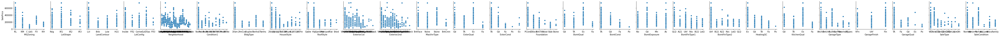

In [242]:
plt.figure(figsize=(20,12))
sns.pairplot(data=df, y_vars="SalePrice", x_vars=num_values)
plt.show()

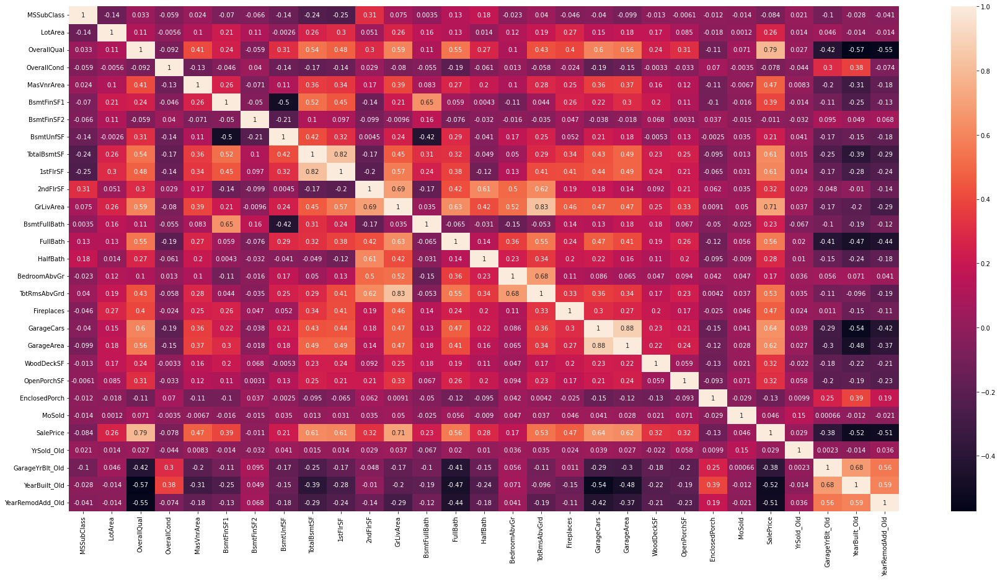

In [243]:
# heat map
plt.figure(figsize=(30,15))
sns.heatmap(df[list(df.dtypes[df.dtypes!='object'].index)].corr(),annot=True)
plt.show()

## Outlier detection and removing outliers of numerical features

In [244]:
df.describe()

,MSSubClass,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,SalePrice,YrSold_Old,GarageYrBlt_Old,YearBuilt_Old,YearRemodAdd_Old
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,10516.828082,6.099315,5.575342,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,...,472.980137,94.244521,46.660274,21.954110,6.321918,180921.195890,2.184247,29.691096,38.732192,25.134247
std,42.300571,9981.264932,1.382997,1.112799,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,...,213.804841,125.338794,66.256028,61.119149,2.703626,79442.502883,1.328095,25.121824,30.202904,20.645407
min,20.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,34900.000000,0.000000,-1.000000,0.000000,0.000000
25%,20.000000,7553.500000,5.000000,5.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,...,334.500000,0.000000,0.000000,0.000000,5.000000,129975.000000,1.000000,7.000000,10.000000,6.000000
50%,50.000000,9478.500000,6.000000,5.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,...,480.000000,0.000000,25.000000,0.000000,6.000000,163000.000000,2.000000,25.500000,37.000000,16.000000
75%,70.000000,11601.500000,7.000000,6.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,...,576.000000,168.000000,68.000000,0.000000,8.000000,214000.000000,3.000000,48.000000,56.000000,43.000000
max,190.000000,215245.000000,10.000000,9.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,...,1418.000000,857.000000,547.000000,552.000000,12.000000,755000.000000,4.000000,110.000000,138.000000,60.000000


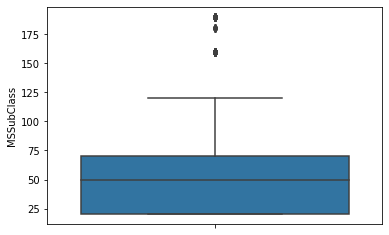

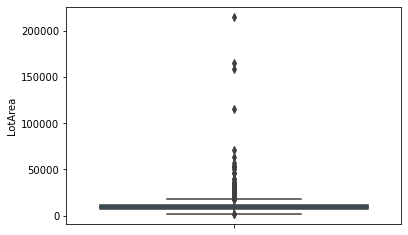

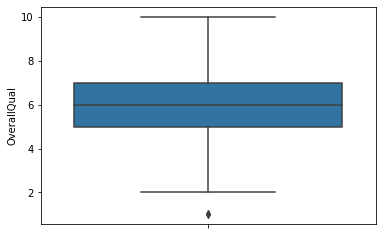

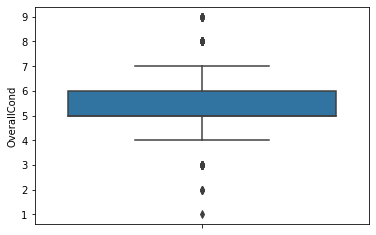

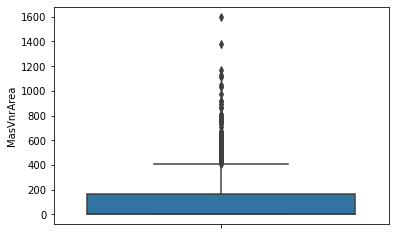

...

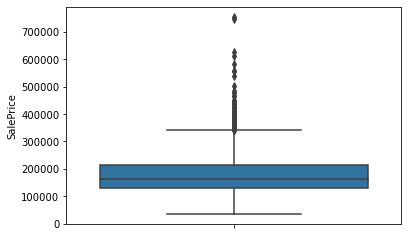

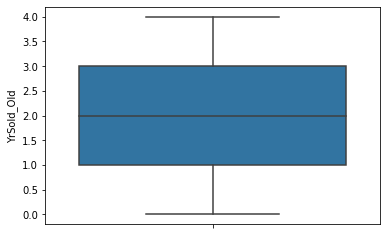

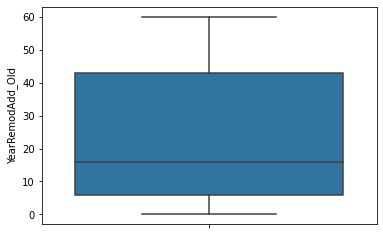

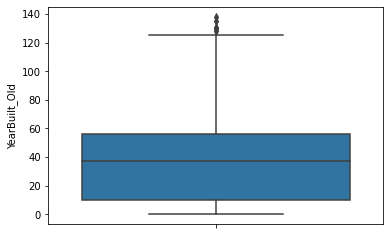

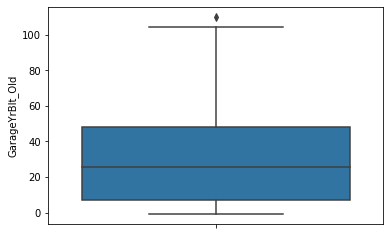

In [245]:
num_columns = ['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'MoSold',
       'SalePrice', 'YrSold_Old', 'YearRemodAdd_Old', 'YearBuilt_Old',
       'GarageYrBlt_Old']
for column in num_columns:
    plt.figure()
    sns.boxplot(y=df[column])
    plt.show()

In [246]:
# outliers operation of numerical variables by taking upper_quantile=0.95 and lower_quantile=0.25
def drop_outliers(x):
    lists = []
    for column in num_columns:
        Q1 = x[column].quantile(.25)
        Q3 = x[column].quantile(.95)
        IQR = Q3-Q1
        x =  x[(x[column] >= (Q1-(1.5*IQR))) & (x[column] <= (Q3+(1.5*IQR)))] 
    return x   

df = drop_outliers(df)

In [247]:
#from 1460 rows we now have 1417 rows
df.shape

(1417, 56)

In [248]:
# detecting the highly skewed column data
drop = []
for column in df.columns :
    max_pct = np.max(df[column].value_counts(normalize=True) * 100)
    if (max_pct > 90) :
        print(column, 'Max percentage of value=', str(max_pct))
        drop.append(column)

LandContour Max percentage of value= 90.75511644318985
BsmtCond Max percentage of value= 92.37826393789696
GarageQual Max percentage of value= 95.41284403669725


In [249]:
# Dropping 3 column features 
df.drop(drop, axis=1, inplace=True)

In [250]:
# we can see the result of it
df.shape

(1417, 53)

## Data Tranformation

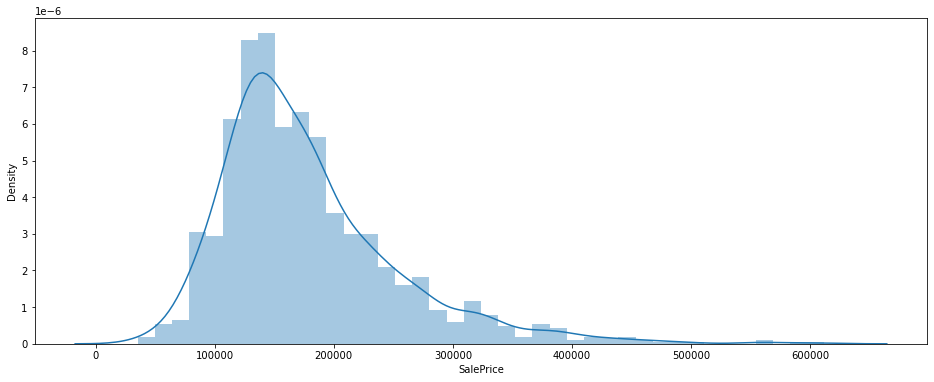

In [251]:
# distribution of target variable
plt.figure(figsize=(16,6))
sns.distplot(df.SalePrice)
plt.show()

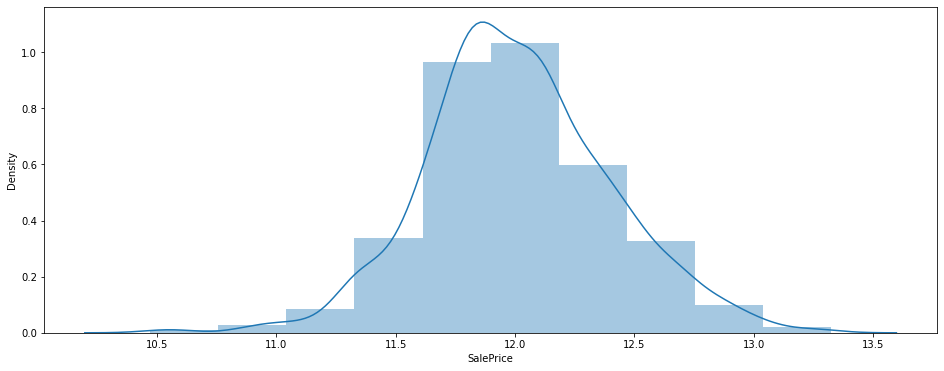

In [252]:
df['SalePrice'] = np.log(df.SalePrice)
plt.figure(figsize=(16,6))
sns.distplot(df.SalePrice, bins=10)
plt.show()

In [253]:
# now our target variable are normally distributed
df.SalePrice.describe()

count    1417.000000
mean       12.012220
std         0.389898
min        10.471950
25%        11.767568
50%        11.982929
75%        12.254863
max        13.323927
Name: SalePrice, dtype: float64

<Figure size 1440x864 with 0 Axes>

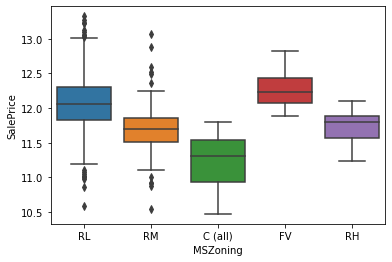

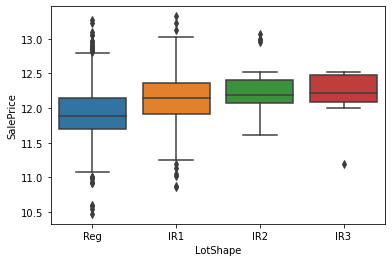

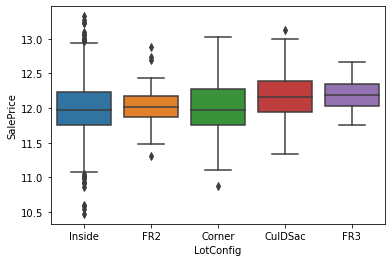

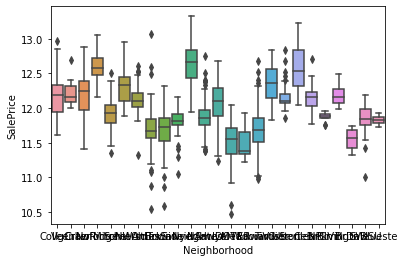

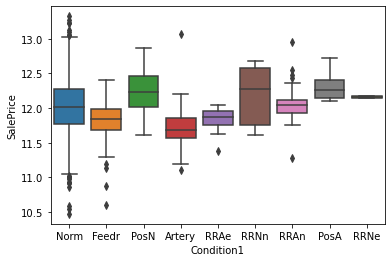

...

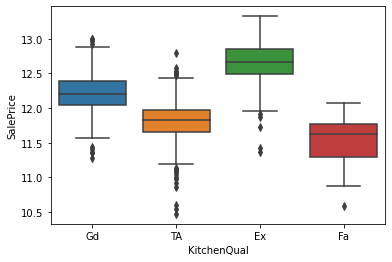

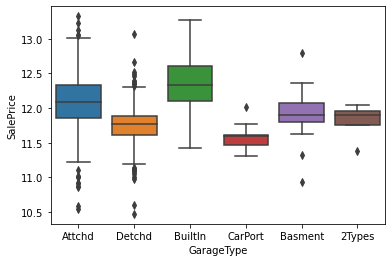

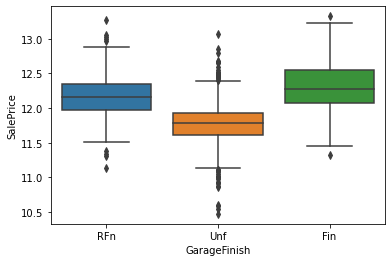

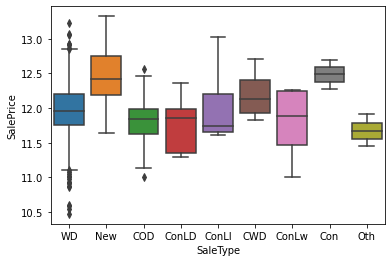

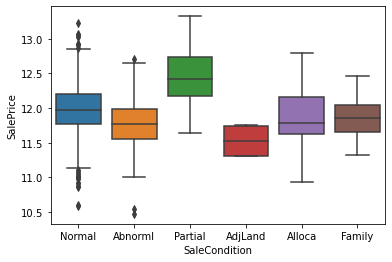

In [254]:
plt.figure(figsize=(20,12))
cat_columns = ['MSZoning','LotShape','LotConfig','Neighborhood','Condition1','BldgType','HouseStyle','RoofStyle',
 'Exterior1st','Exterior2nd','MasVnrType','ExterQual','ExterCond','Foundation','BsmtQual','BsmtExposure','BsmtFinType1',
 'BsmtFinType2','HeatingQC','KitchenQual','GarageType','GarageFinish','SaleType','SaleCondition']
for column in cat_columns:
    plt.figure()
    sns.boxplot(x=column, y='SalePrice', data=df)
    plt.show()

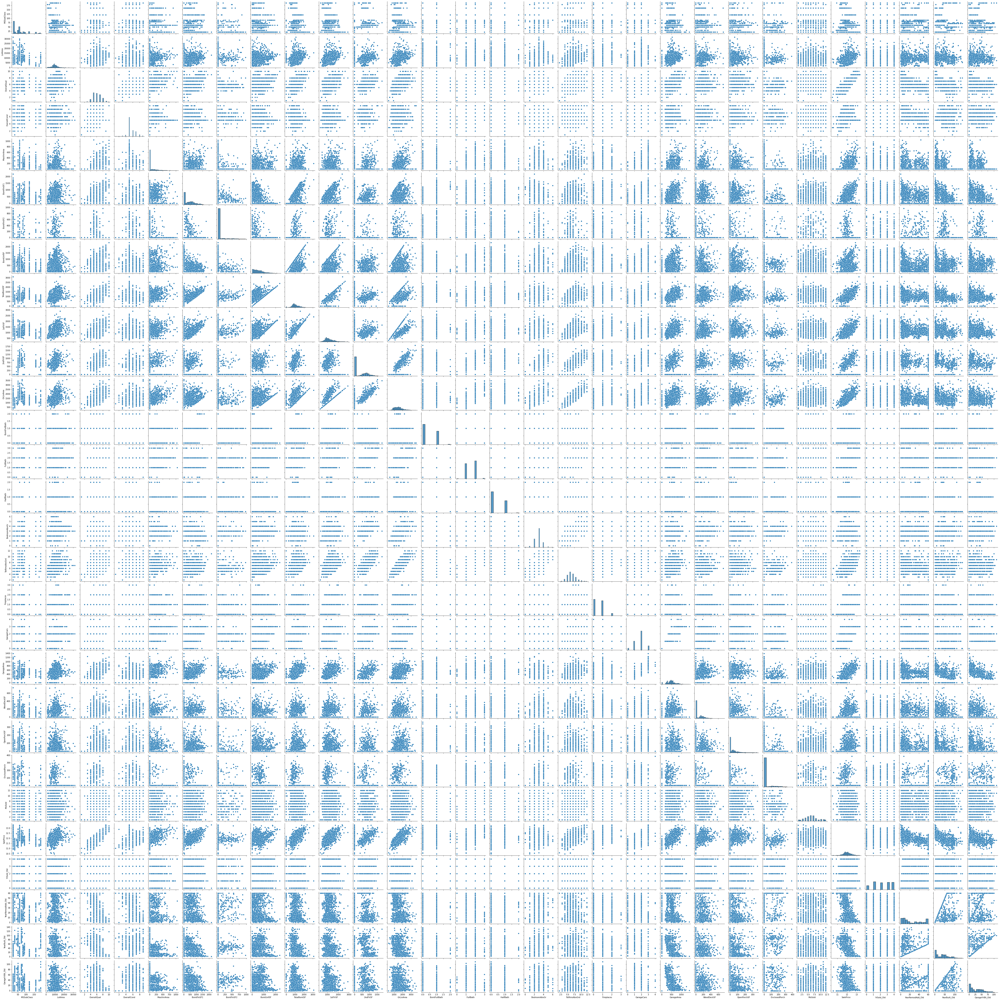

In [255]:
# Pairplot of numerical or continuous variables
sns.pairplot(data=df,vars=num_columns)
plt.show()

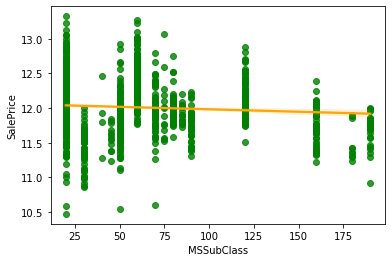

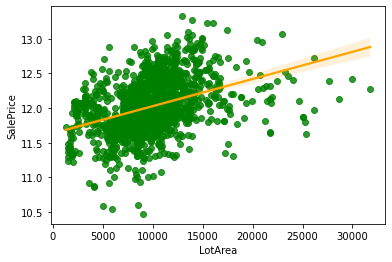

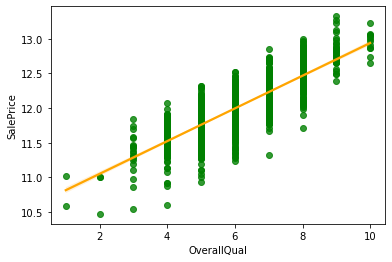

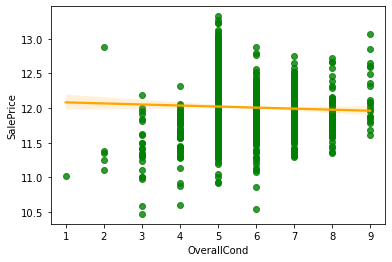

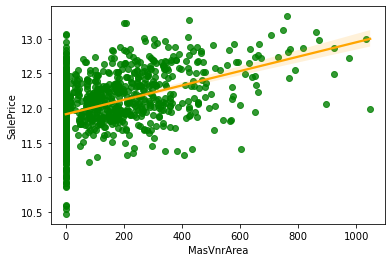

...

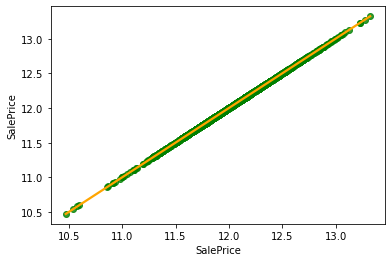

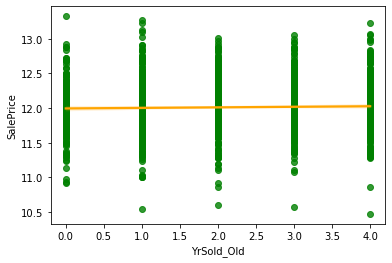

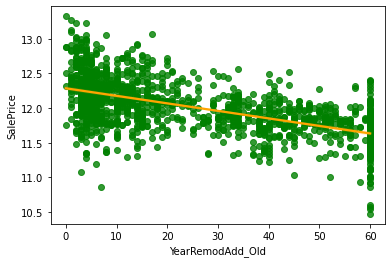

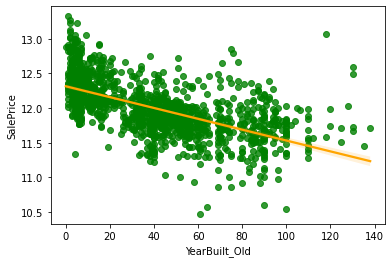

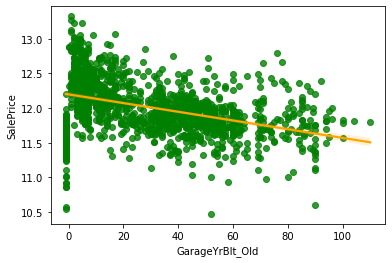

In [256]:
# Regression plot between all numerical variables and target variable('SalePrice') 
for column in num_columns:
    plt.figure()
    #sns.regplot(x=col, y='SalePrice', data=df)
    sns.regplot(x=column, y="SalePrice", data=df,
                 scatter_kws={"color": "green"}, line_kws={"color": "orange"})
    plt.show()

In [257]:
df.corr() # Correlation between Continuous variables

,MSSubClass,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,SalePrice,YrSold_Old,GarageYrBlt_Old,YearBuilt_Old,YearRemodAdd_Old
MSSubClass,1.000000,-0.384350,0.038059,-0.062449,0.023027,-0.079589,-0.065131,-0.139901,-0.260019,-0.269992,...,-0.106212,-0.019701,0.004972,-0.007025,-0.004653,-0.076210,0.017706,-0.100381,-0.031162,-0.042366
LotArea,-0.384350,1.000000,0.188026,-0.004660,0.126450,0.157460,0.070378,0.094670,0.294459,0.399435,...,0.307633,0.155250,0.134642,-0.013366,0.010823,0.392342,0.013500,0.022421,-0.060560,-0.043922
OverallQual,0.038059,0.188026,1.000000,-0.099208,0.413169,0.211424,-0.099227,0.316455,0.538943,0.466900,...,0.561119,0.235298,0.329384,-0.126189,0.073167,0.825449,0.020959,-0.423743,-0.583855,-0.553081
OverallCond,-0.062449,-0.004660,-0.099208,1.000000,-0.133831,-0.028771,0.049119,-0.147938,-0.176839,-0.144943,...,-0.148376,-0.011507,-0.046071,0.090609,-0.005545,-0.042996,-0.039127,0.298440,0.374877,-0.069596
MasVnrArea,0.023027,0.126450,0.413169,-0.133831,1.000000,0.218836,-0.065635,0.129528,0.352320,0.335200,...,0.379225,0.151586,0.130814,-0.106606,0.007966,0.438692,-0.010341,-0.203337,-0.319317,-0.177202
BsmtFinSF1,-0.079589,0.157460,0.211424,-0.028771,0.218836,1.000000,-0.047999,-0.542963,0.445362,0.369096,...,0.257960,0.174349,0.080515,-0.121174,0.005728,0.372172,-0.028764,-0.108476,-0.251368,-0.129117
BsmtFinSF2,-0.065131,0.070378,-0.099227,0.049119,-0.065635,-0.047999,1.000000,-0.196667,0.067208,0.069375,...,-0.035593,0.057903,-0.017153,0.052926,-0.005284,-0.046518,-0.034525,0.101597,0.066766,0.092673
BsmtUnfSF,-0.139901,0.094670,0.316455,-0.147938,0.129528,-0.542963,-0.196667,1.000000,0.459728,0.346136,...,0.196384,0.012349,0.131661,-0.008333,0.029145,0.234942,0.040636,-0.169312,-0.156407,-0.182264
TotalBsmtSF,-0.260019,0.294459,0.538943,-0.176839,0.352320,0.445362,0.067208,0.459728,1.000000,0.794960,...,0.477370,0.217579,0.224411,-0.119782,0.036371,0.637090,0.002712,-0.267210,-0.415970,-0.306305
1stFlrSF,-0.269992,0.399435,0.466900,-0.144943,0.335200,0.369096,0.069375,0.346136,0.794960,1.000000,...,0.478585,0.214912,0.183686,-0.088101,0.055988,0.607106,0.000662,-0.181127,-0.294668,-0.249848


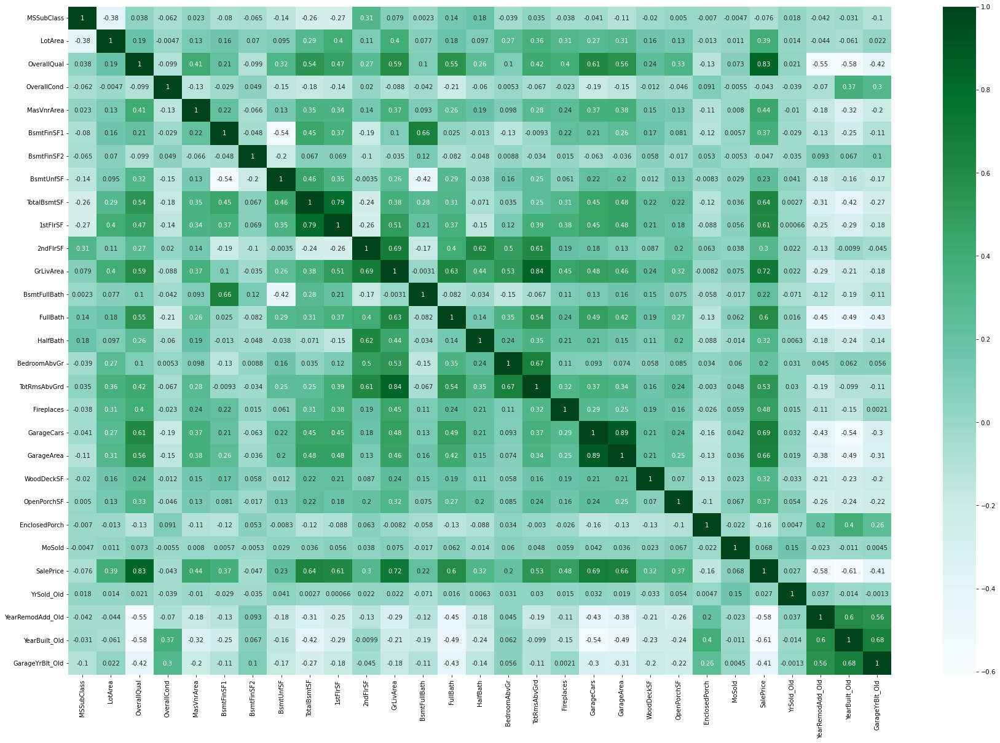

In [258]:
# Checking numerical variable correlation using heatmap
plt.figure(figsize=(30,20))
sns.heatmap(df[num_columns].corr(), cmap='BuGn', annot = True)
plt.show()

In [259]:
# dropping variables whose correlation is above 70%
def correlation(dataset, threshold):
    col_corr = set() 
    corr_matrix = df.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: 
                colname = corr_matrix.columns[i]  
                col_corr.add(colname)
    return col_corr

In [260]:
# correlations of continuous variables 
df.corr()

,MSSubClass,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,SalePrice,YrSold_Old,GarageYrBlt_Old,YearBuilt_Old,YearRemodAdd_Old
MSSubClass,1.000000,-0.384350,0.038059,-0.062449,0.023027,-0.079589,-0.065131,-0.139901,-0.260019,-0.269992,...,-0.106212,-0.019701,0.004972,-0.007025,-0.004653,-0.076210,0.017706,-0.100381,-0.031162,-0.042366
LotArea,-0.384350,1.000000,0.188026,-0.004660,0.126450,0.157460,0.070378,0.094670,0.294459,0.399435,...,0.307633,0.155250,0.134642,-0.013366,0.010823,0.392342,0.013500,0.022421,-0.060560,-0.043922
OverallQual,0.038059,0.188026,1.000000,-0.099208,0.413169,0.211424,-0.099227,0.316455,0.538943,0.466900,...,0.561119,0.235298,0.329384,-0.126189,0.073167,0.825449,0.020959,-0.423743,-0.583855,-0.553081
OverallCond,-0.062449,-0.004660,-0.099208,1.000000,-0.133831,-0.028771,0.049119,-0.147938,-0.176839,-0.144943,...,-0.148376,-0.011507,-0.046071,0.090609,-0.005545,-0.042996,-0.039127,0.298440,0.374877,-0.069596
MasVnrArea,0.023027,0.126450,0.413169,-0.133831,1.000000,0.218836,-0.065635,0.129528,0.352320,0.335200,...,0.379225,0.151586,0.130814,-0.106606,0.007966,0.438692,-0.010341,-0.203337,-0.319317,-0.177202
BsmtFinSF1,-0.079589,0.157460,0.211424,-0.028771,0.218836,1.000000,-0.047999,-0.542963,0.445362,0.369096,...,0.257960,0.174349,0.080515,-0.121174,0.005728,0.372172,-0.028764,-0.108476,-0.251368,-0.129117
BsmtFinSF2,-0.065131,0.070378,-0.099227,0.049119,-0.065635,-0.047999,1.000000,-0.196667,0.067208,0.069375,...,-0.035593,0.057903,-0.017153,0.052926,-0.005284,-0.046518,-0.034525,0.101597,0.066766,0.092673
BsmtUnfSF,-0.139901,0.094670,0.316455,-0.147938,0.129528,-0.542963,-0.196667,1.000000,0.459728,0.346136,...,0.196384,0.012349,0.131661,-0.008333,0.029145,0.234942,0.040636,-0.169312,-0.156407,-0.182264
TotalBsmtSF,-0.260019,0.294459,0.538943,-0.176839,0.352320,0.445362,0.067208,0.459728,1.000000,0.794960,...,0.477370,0.217579,0.224411,-0.119782,0.036371,0.637090,0.002712,-0.267210,-0.415970,-0.306305
1stFlrSF,-0.269992,0.399435,0.466900,-0.144943,0.335200,0.369096,0.069375,0.346136,0.794960,1.000000,...,0.478585,0.214912,0.183686,-0.088101,0.055988,0.607106,0.000662,-0.181127,-0.294668,-0.249848


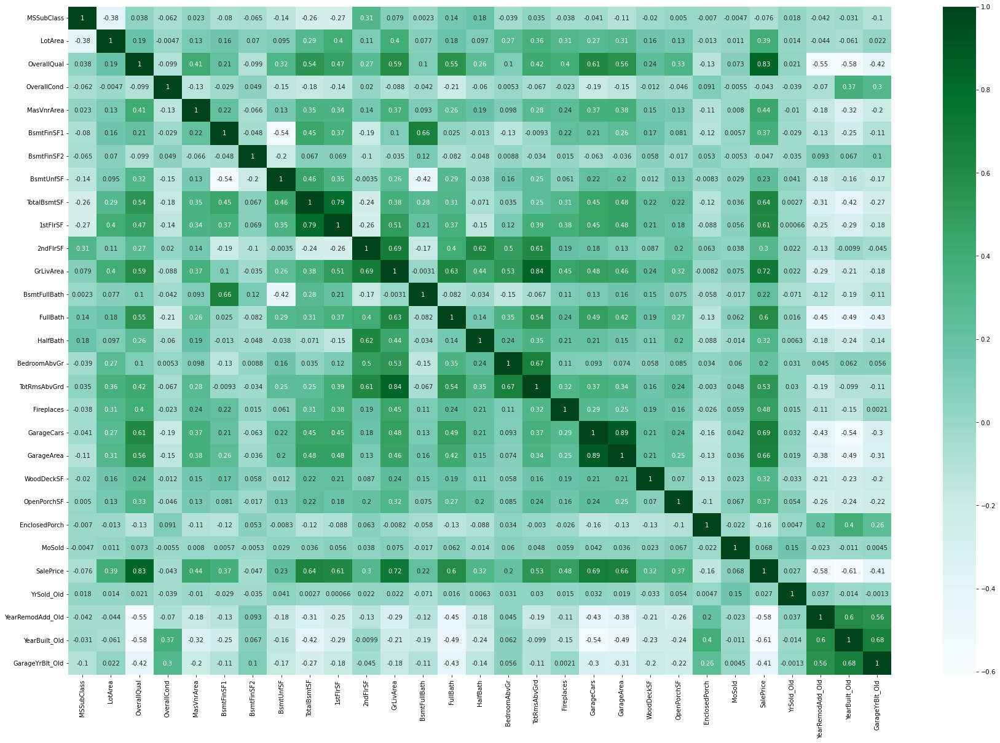

In [261]:
# Checking numerical variable correlation using heatmap
plt.figure(figsize=(30,20))
sns.heatmap(df[num_columns].corr(), cmap='BuGn', annot = True)
plt.show()

In [262]:
# dropping variables whose correlation is above 70%
def correlation(dataset, threshold):
    col_corr = set() 
    corr_matrix = df.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: 
                colname = corr_matrix.columns[i]  
                col_corr.add(colname)
    return col_corr

In [263]:
corr_features = correlation(df, 0.7)
len(set(corr_features))

4

4 features have high correlation so we have to drop it

In [264]:
# dropping higly correlated features excluding SalePrice as it is our target variable
df = df.drop(['1stFlrSF', 'GarageArea', 'TotRmsAbvGrd'],axis=1)

In [265]:
df.shape

(1417, 50)

## Dummy variables operation

In [266]:
# columns shows some type of order and hence we can say these are ordinal in nature
df[['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual', 'GarageFinish']].head()

,ExterQual,ExterCond,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,KitchenQual,GarageFinish
0,Gd,TA,Gd,No,GLQ,Unf,Ex,Gd,RFn
1,TA,TA,Gd,Gd,ALQ,Unf,Ex,TA,RFn
2,Gd,TA,Gd,Mn,GLQ,Unf,Ex,Gd,RFn
3,TA,TA,TA,No,ALQ,Unf,Gd,Gd,Unf
4,Gd,TA,Gd,Av,GLQ,Unf,Ex,Gd,RFn


In [267]:
# creating dummy variables of ordinal variables
df['ExterQual'] = df.ExterQual.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
df['ExterCond'] = df.ExterCond.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
df['BsmtQual'] = df.BsmtQual.map({'NA':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5})
df['BsmtExposure'] = df.BsmtExposure.map({'NA':0,'No':1,'Mn':2,'Av':3,'Gd':4})
df['BsmtFinType1'] = df.BsmtFinType1.map({'NA':0,'Unf':1,'LwQ':2,'Rec':3,'BLQ':4,'ALQ':5,'GLQ':6})
df['BsmtFinType2'] = df.BsmtFinType2.map({'NA':0,'Unf':1,'LwQ':2,'Rec':3,'BLQ':4,'ALQ':5,'GLQ':6})
df['HeatingQC'] = df.HeatingQC.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
df['KitchenQual'] = df.KitchenQual.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
df['GarageFinish'] = df.GarageFinish.map({'NA':0,'Unf':1,'RFn':2,'Fin':3})

In [268]:
df[['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual', 'GarageFinish']].head()

,ExterQual,ExterCond,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,KitchenQual,GarageFinish
0,3,2,4,1,6,1,4,3,2
1,2,2,4,4,5,1,4,2,2
2,3,2,4,2,6,1,4,3,2
3,2,2,3,1,5,1,3,3,1
4,3,2,4,3,6,1,4,3,2


In [269]:
# creating dummy variables for categorical features excluding ordinal features as we already created their dummy

dummy_col = pd.get_dummies(df[['MSZoning','LotShape','LotConfig','Neighborhood','Condition1','BldgType','HouseStyle',
 'RoofStyle','Exterior1st','Exterior2nd','MasVnrType','Foundation','GarageType','SaleType',
 'SaleCondition']],drop_first=True)

df = pd.concat([df,dummy_col],axis='columns')

df = df.drop(['MSZoning','LotShape','LotConfig','Neighborhood','Condition1','BldgType','HouseStyle','RoofStyle',
 'Exterior1st','Exterior2nd','MasVnrType','Foundation','GarageType','SaleType','SaleCondition'],axis='columns')

In [270]:
df

,MSSubClass,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtExposure,BsmtFinType1,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,8450,7,5,196.0,3,2,4,1,6,...,0,0,0,0,1,0,0,0,1,0
1,20,9600,6,8,0.0,2,2,4,4,5,...,0,0,0,0,1,0,0,0,1,0
2,60,11250,7,5,162.0,3,2,4,2,6,...,0,0,0,0,1,0,0,0,1,0
3,70,9550,7,5,0.0,2,2,3,1,5,...,0,0,0,0,1,0,0,0,0,0
4,60,14260,8,5,350.0,3,2,4,3,6,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,20,7500,7,5,0.0,3,2,4,1,6,...,0,0,0,0,1,0,0,0,1,0
1455,60,7917,6,5,0.0,2,2,4,1,1,...,0,0,0,0,1,0,0,0,1,0
1456,20,13175,6,6,119.0,2,2,4,1,5,...,0,0,0,0,1,0,0,0,1,0
1457,70,9042,7,9,0.0,4,3,3,1,6,...,0,0,0,0,1,0,0,0,1,0


## Train and Test split

In [271]:
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(df, train_size = 0.75, test_size = 0.25, random_state = 100)

In [272]:
df_train.shape

(1062, 149)

In [273]:
df_test.shape

(355, 149)

In [274]:
# For rescaling the Features, we will use MinMax scaling.
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()


In [275]:
# Scaling continuous features

num_var = ['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF',
       'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'Fireplaces', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', 'MoSold', 'SalePrice', 'YrSold_Old',
       'YearRemodAdd_Old', 'YearBuilt_Old', 'GarageYrBlt_Old']
df_train[num_var] = scaler.fit_transform(df_train[num_var])
df_test[num_var] = scaler.transform(df_test[num_var])
df_train.head()

,MSSubClass,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtExposure,BsmtFinType1,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
933,0.000000,0.231407,0.666667,0.500,0.200573,3,2,4,3,6,...,0,0,0,0,1,0,0,0,1,0
1174,0.294118,0.497904,0.555556,0.875,0.000000,2,2,4,1,3,...,0,0,0,0,1,0,0,0,1,0
365,0.294118,0.304130,0.444444,0.750,0.000000,2,3,3,1,3,...,0,0,0,0,1,0,0,0,1,0
480,0.000000,0.480507,0.888889,0.500,0.361032,3,2,5,4,6,...,0,0,0,0,1,0,0,0,1,0
1450,0.411765,0.248341,0.444444,0.500,0.000000,2,2,4,1,1,...,0,0,0,0,1,0,0,0,1,0


In [276]:
# Dividing into X and Y sets for the model building
y_train = df_train.pop('SalePrice')
X_train = df_train
y_test = df_test.pop('SalePrice')
X_test = df_test

In [277]:
print(y_train.shape)

print(X_train.shape)

print(X_test.shape)

print(y_test.shape)

(1062,)
(1062, 148)
(355, 148)
(355,)


In [278]:
# Recursive feature elimination(RFE)
# Importing RFE and LinearRegression

from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [279]:
lm = LinearRegression()
lm.fit(X_train, y_train)

# Running RFE with the output number of the variable 60
rfe = RFE(lm, n_features_to_select=60)            
rfe = rfe.fit(X_train, y_train)

In [280]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('MSSubClass', False, 82),
 ('LotArea', True, 1),
 ('OverallQual', True, 1),
 ('OverallCond', True, 1),
 ('MasVnrArea', True, 1),
 ('ExterQual', False, 87),
 ('ExterCond', False, 29),
 ('BsmtQual', False, 68),
 ('BsmtExposure', False, 62),
 ('BsmtFinType1', False, 73),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinType2', False, 80),
 ('BsmtFinSF2', True, 1),
 ('BsmtUnfSF', True, 1),
 ('TotalBsmtSF', True, 1),
 ('HeatingQC', False, 39),
 ('2ndFlrSF', False, 24),
 ('GrLivArea', True, 1),
 ('BsmtFullBath', True, 1),
 ('FullBath', False, 59),
 ('HalfBath', False, 12),
 ('BedroomAbvGr', False, 49),
 ('KitchenQual', False, 60),
 ('Fireplaces', True, 1),
 ('GarageFinish', False, 64),
 ('GarageCars', True, 1),
 ('WoodDeckSF', False, 2),
 ('OpenPorchSF', True, 1),
 ('EnclosedPorch', True, 1),
 ('MoSold', False, 78),
 ('YrSold_Old', False, 53),
 ('GarageYrBlt_Old', False, 10),
 ('YearBuilt_Old', True, 1),
 ('YearRemodAdd_Old', False, 9),
 ('MSZoning_FV', True, 1),
 ('MSZoning_RH', True, 1),
 ('MSZoning_

In [281]:
# top 60 feature which is more important for the model after RFE

col = X_train.columns[rfe.support_]
col

Index(['LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'GrLivArea', 'BsmtFullBath',
       'Fireplaces', 'GarageCars', 'OpenPorchSF', 'EnclosedPorch',
       'YearBuilt_Old', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL',
       'MSZoning_RM', 'LotConfig_FR2', 'Neighborhood_BrDale',
       'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_MeadowV',
       'Neighborhood_NWAmes', 'Neighborhood_NridgHt', 'Neighborhood_StoneBr',
       'Condition1_PosA', 'Condition1_RRAe', 'BldgType_2fmCon',
       'BldgType_Duplex', 'RoofStyle_Gable', 'RoofStyle_Gambrel',
       'RoofStyle_Hip', 'RoofStyle_Mansard', 'RoofStyle_Shed',
       'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_BrkFace',
       'Exterior1st_CBlock', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc',
       'Exterior1st_Stucco', 'Exterior2nd_AsphShn', 'Exterior2nd_CBlock',
       'Exterior2nd_CmentBd', 'Exterior2nd_Other', 'Exterior2nd_Stucco',


In [282]:
X_train.columns[~rfe.support_]

Index(['MSSubClass', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', '2ndFlrSF', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenQual', 'GarageFinish', 'WoodDeckSF',
       'MoSold', 'YrSold_Old', 'GarageYrBlt_Old', 'YearRemodAdd_Old',
       'LotShape_IR2', 'LotShape_IR3', 'LotShape_Reg', 'LotConfig_CulDSac',
       'LotConfig_FR3', 'LotConfig_Inside', 'Neighborhood_Blueste',
       'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_CollgCr',
       'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_Mitchel',
       'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NoRidge',
       'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer',
       'Neighborhood_SawyerW', 'Neighborhood_Somerst', 'Neighborhood_Timber',
       'Neighborhood_Veenker', 'Condition1_Feedr', 'Condition1_Norm',
       'Condition1_PosN', 'Condition1_RRAn', 'Condition1_RRNe',
       'Condition1_RRNn', 'BldgTy

## Building model using statsmodel, for the detailed statistics

In [283]:
X_train.columns[~rfe.support_]

Index(['MSSubClass', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', '2ndFlrSF', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenQual', 'GarageFinish', 'WoodDeckSF',
       'MoSold', 'YrSold_Old', 'GarageYrBlt_Old', 'YearRemodAdd_Old',
       'LotShape_IR2', 'LotShape_IR3', 'LotShape_Reg', 'LotConfig_CulDSac',
       'LotConfig_FR3', 'LotConfig_Inside', 'Neighborhood_Blueste',
       'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_CollgCr',
       'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_Mitchel',
       'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NoRidge',
       'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer',
       'Neighborhood_SawyerW', 'Neighborhood_Somerst', 'Neighborhood_Timber',
       'Neighborhood_Veenker', 'Condition1_Feedr', 'Condition1_Norm',
       'Condition1_PosN', 'Condition1_RRAn', 'Condition1_RRNe',
       'Condition1_RRNn', 'BldgTy

In [284]:
X_train_rfe = X_train[col]

In [285]:
X_train_rfe.shape

(1062, 60)

In [286]:
import statsmodels.api as sm  
X_train_rfe = sm.add_constant(X_train_rfe)

# Running the linear model
lm = sm.OLS(y_train,X_train_rfe).fit() 

In [287]:
y_Pred = lm.predict(X_train_rfe)
print(r2_score(y_train, y_Pred))
RSS = np.sum(np.square(y_train-y_Pred))
print(RSS)
MSE = mean_squared_error(y_train, y_Pred)
print(MSE)
RMSE = (MSE*0.5)
print(RMSE)

0.929516124552159
1.4582353806062793
0.001373102994921167
0.0006865514974605834


In [288]:
# r2 = 93.36% (well performance of model in the train set), RSS = 1.223, MSE = 0.00133, RMSE = 0.00066 

Text(0.5, 0, 'Errors')

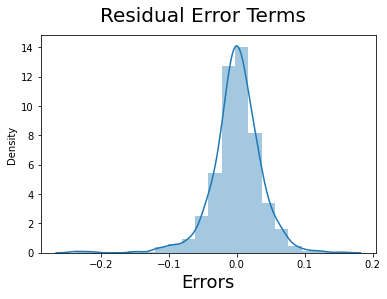

In [289]:
y_Pred = lm.predict(X_train_rfe)
res = y_train-y_Pred
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((res), bins = 20)
fig.suptitle('Residual Error Terms', fontsize = 20)                 
plt.xlabel('Errors', fontsize = 18) 

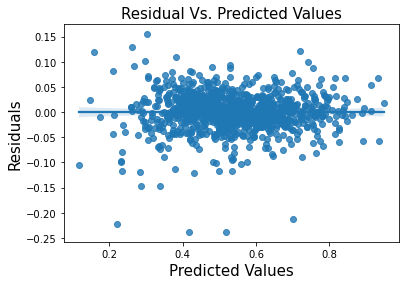

In [290]:
sns.regplot(x=y_Pred, y=res)
plt.title('Residual Vs. Predicted Values', fontdict={'fontsize': 15})
plt.xlabel('Predicted Values', fontdict={'fontsize': 15})
plt.ylabel('Residuals', fontdict={'fontsize': 15})

plt.show()

In [291]:
X_train_new = X_train_rfe.drop(['const'], axis=1)

# Creating X_test_new dataframe by dropping variables from X_test using final trained column information

X_test_new = X_test[X_train_new.columns]

# Adding a constant variable to X_test_new dataset

X_test_new = sm.add_constant(X_test_new)

In [292]:
X_test_new

,const,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,GrLivArea,...,MasVnrType_Stone,Foundation_PConc,Foundation_Wood,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_New,SaleType_Oth,SaleCondition_AdjLand,SaleCondition_Normal
995,1.0,0.106790,0.333333,0.750,0.000000,0.175503,0.000000,0.155394,0.241435,0.273671,...,0,0,0,0,0,0,0,0,0,0
810,1.0,0.285974,0.555556,0.625,0.094556,0.303016,0.387860,0.000000,0.336134,0.297801,...,0,0,0,0,0,0,0,0,0,1
781,1.0,0.187370,0.555556,0.500,0.000000,0.176874,0.000000,0.160103,0.245960,0.387599,...,0,1,0,0,0,0,0,0,0,1
859,1.0,0.315320,0.555556,0.750,0.210124,0.282907,0.000000,0.186216,0.340659,0.708613,...,0,0,0,0,0,0,0,0,0,1
584,1.0,0.153270,0.333333,0.750,0.000000,0.000000,0.000000,0.378425,0.285714,0.378436,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,1.0,0.202093,0.333333,0.625,0.000000,0.258227,0.000000,0.119863,0.273109,0.156078,...,0,0,0,0,0,0,0,0,0,1
1299,1.0,0.198825,0.444444,0.750,0.000000,0.155393,0.932099,0.000000,0.402715,0.278558,...,0,0,0,0,0,0,0,0,0,1
1260,1.0,0.766019,0.555556,0.500,0.000000,0.000000,0.000000,0.360017,0.271816,0.409591,...,0,1,0,0,0,0,0,0,0,1
870,1.0,0.169115,0.444444,0.500,0.000000,0.000000,0.000000,0.382705,0.288946,0.171045,...,0,0,0,0,0,0,0,0,0,1


In [293]:
y_pred = lm.predict(X_test_new)

In [294]:
r2_test=r2_score(y_test, y_pred)
round(r2_test,3)

0.899

In [295]:
# r2 on train data = 93.36%
# r2 on test data = 89.7%
# from above result we can observe thet model is performing well and not overfitted

In [296]:
RSS_test = np.sum(np.square(y_test-y_pred))
RSS_test

0.7103303898095065

In [297]:
MSE_test = mean_squared_error(y_test,y_pred)
MSE_test

0.0020009306755197367

In [298]:
RMSE_test = (MSE_test*0.5)
print(RMSE_test)

0.0010004653377598683


In [299]:
# r2_test = 89.7% , RSS = 0.957, MSE = 0.0019, RMSE = 0.00096

## LASSO Regression

In [300]:
lasso = Lasso()
params = {'alpha': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 
                    9.0, 10.0, 20, 50, 100, 500, 1000 ]}
folds = 3
# cross validation
lasso_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
lasso_cv.fit(X_train, y_train)

Fitting 3 folds for each of 27 candidates, totalling 81 fits


GridSearchCV(cv=3, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5,
                                   0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0,
                                   6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500,
                                   1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [301]:
# the best hyperparameter alpha
print(lasso_cv.best_params_)

{'alpha': 0.0001}


In [302]:
# Fitting data using our best aplha or lambda value
lasso = Lasso(alpha=0.0001)
lasso.fit(X_train, y_train)

Lasso(alpha=0.0001)

In [303]:
# printing coefficient values of all our features
lasso.coef_

array([-1.60379527e-02,  7.27399504e-02,  1.72677321e-01,  1.31345698e-01,
        8.29433254e-03,  4.95261510e-03, -7.07604221e-03,  5.34000327e-03,
        3.77076354e-03,  2.08487071e-03,  5.59580958e-02,  8.62624712e-04,
        0.00000000e+00,  0.00000000e+00,  9.71372447e-02,  7.12987851e-03,
        0.00000000e+00,  2.83658813e-01,  7.63452079e-03,  0.00000000e+00,
        1.25010032e-02,  8.59679556e-03,  6.01662533e-03,  2.86109809e-02,
        3.71227237e-03,  6.21088835e-02,  1.69888592e-02,  2.07891217e-02,
        2.14232719e-02,  1.38713154e-04,  5.44139753e-03,  9.62807307e-03,
       -1.04676257e-01, -1.01888769e-02,  1.92309540e-02, -0.00000000e+00,
        1.80716309e-02,  0.00000000e+00,  2.39519651e-03,  0.00000000e+00,
        6.67127297e-04,  8.09311558e-03, -9.90743456e-03, -0.00000000e+00,
       -1.02303823e-03,  0.00000000e+00, -0.00000000e+00,  1.32100452e-02,
        0.00000000e+00, -7.82589428e-04,  4.25429716e-02, -1.51948405e-02,
       -4.27487893e-03, -

In [304]:
len(lasso.coef_)

148

In [305]:
# R2, RSS, MSE values for test and train sets in Lasso

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3=[]
r2_train_lr = r2_score(y_train,y_pred_train )
print("r2_train:")
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("r2_test:")
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train-y_pred_train))
print("RSS_train:")
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("RSS_test:")
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train,y_pred_train)
print("MSE_train:")
print(mse_train_lr)
metric3.append(mse_train_lr)

mse_test_lr = mean_squared_error(y_test , y_pred_test)
print("MSE_test:")
print(mse_test_lr)
metric3.append(mse_test_lr)

r2_train:
0.9327630693577654
r2_test:
0.9062273373479326
RSS_train:
1.3910595937425896
RSS_test:
0.6615523690588422
MSE_train:
0.0013098489583263555
MSE_test:
0.0018635278001657527


In [306]:
# coefficient of Lasso model made with different range of alpha(lamda) value
cv_result_lsso = pd.DataFrame(lasso_cv.cv_results_)
cv_result_lsso['param_alpha'] = cv_result_lsso['param_alpha'].astype('float32')
cv_result_lsso.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,0.009640,0.001696,0.002879,0.000991,0.0001,{'alpha': 0.0001},-0.030556,-0.029122,-0.028153,-0.029277,0.000987,1,-0.023710,-0.025107,-0.025085,-0.024634,0.000654
1,0.000000,0.000000,0.005207,0.007364,0.0010,{'alpha': 0.001},-0.034971,-0.033355,-0.032512,-0.033613,0.001020,2,-0.031352,-0.032450,-0.032263,-0.032022,0.000480
2,0.000000,0.000000,0.000000,0.000000,0.0100,{'alpha': 0.01},-0.065880,-0.062139,-0.064984,-0.064334,0.001595,3,-0.062102,-0.064228,-0.064284,-0.063538,0.001016
3,0.005208,0.007365,0.005207,0.007363,0.1000,{'alpha': 0.1},-0.110425,-0.106107,-0.111520,-0.109351,0.002337,4,-0.108942,-0.110837,-0.107983,-0.109254,0.001186
4,0.000000,0.000000,0.000000,0.000000,0.2000,{'alpha': 0.2},-0.110425,-0.106107,-0.111520,-0.109351,0.002337,4,-0.108942,-0.110837,-0.107983,-0.109254,0.001186


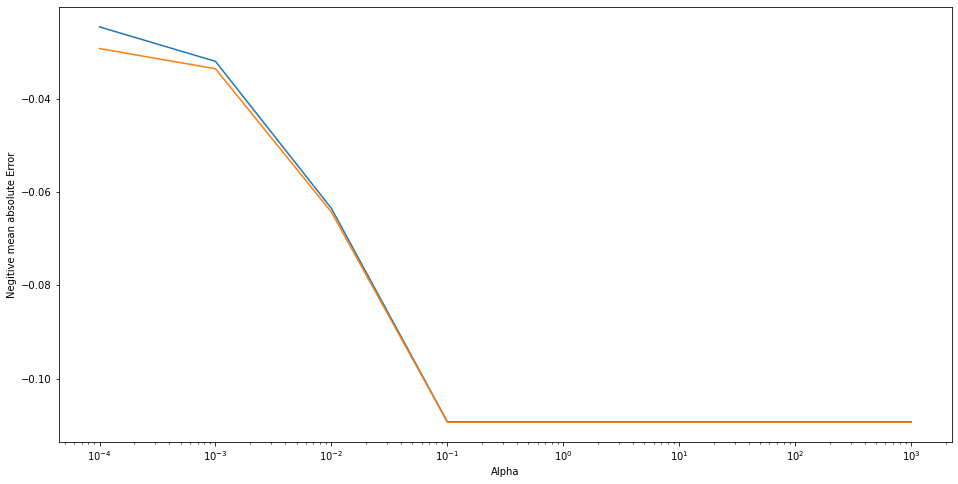

In [307]:
#  Visualising of different value of alpha on Negative mean absolute Error
plt.figure(figsize=(16,8))
plt.plot(cv_result_lsso['param_alpha'],cv_result_lsso['mean_train_score'])
plt.plot(cv_result_lsso['param_alpha'],cv_result_lsso['mean_test_score'])
plt.xscale('log')
plt.ylabel('Negitive mean absolute Error')
plt.xlabel('Alpha')
plt.show()

In [308]:
#checking r2 for the alpha 0.0001 on train and test set
lasso = Lasso(alpha=0.0001)
lasso.fit(X_train ,y_train)

y_train_pred = lasso.predict(X_train)
y_test_pred = lasso.predict(X_test)

print(r2_score(y_true=y_train,y_pred=y_train_pred))
print(r2_score(y_true=y_test,y_pred=y_test_pred))

0.9327630693577654
0.9062273373479326


In [309]:
# printing top 10 features
model_param = list(lasso.coef_)
model_param.insert(0,lasso.intercept_)
cols = df_train.columns
cols.insert(0,'const')
lasso_coef = pd.DataFrame(list(zip(cols,model_param)))
lasso_coef.columns = ['Featuere','Coef']
lasso_coef.sort_values(by='Coef',ascending=False).head(10)

,Featuere,Coef
18,BsmtFullBath,0.283659
3,OverallCond,0.172677
4,MasVnrArea,0.131346
15,HeatingQC,0.097137
2,OverallQual,0.072740
26,WoodDeckSF,0.062109
11,BsmtFinType2,0.055958
0,MSSubClass,0.049114
51,Neighborhood_Edwards,0.042543
67,Neighborhood_Timber,0.038447


In [310]:
# Put the shortlisted Features and coefficienst in a dataframe

lasso_df = pd.DataFrame({'Features':X_train.columns, 'Coefficient':lasso.coef_.round(4)})
lasso_df = lasso_df[lasso_df['Coefficient'] != 0.00]
lasso_df.reset_index(drop=True, inplace=True)
lasso_df

,Features,Coefficient
0,MSSubClass,-0.0160
1,LotArea,0.0727
2,OverallQual,0.1727
3,OverallCond,0.1313
4,MasVnrArea,0.0083
...,...,...
78,SaleType_New,0.0333
79,SaleType_Oth,0.0071
80,SaleType_WD,-0.0059
81,SaleCondition_Alloca,-0.0039


## Ridge Regression

In [311]:
# alpha list
X_test_new = X_test_new.drop(['const'], axis=1)

params = {'alpha': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 
                    9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation

folds = 5
ridge_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
ridge_cv.fit(X_train_new, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5,
                                   0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0,
                                   6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500,
                                   1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [312]:
# the best hyperparameter alpha
print(ridge_cv.best_params_)

{'alpha': 0.8}


In [313]:
#fit the data to ridge
ridge = Ridge(alpha=0.9)
ridge.fit(X_train_new, y_train)
print(ridge.coef_)

[ 0.09183537  0.18427392  0.15333044  0.02400842  0.08950359  0.01189148
  0.02354305  0.08480573  0.28391649  0.01686092  0.03132341  0.07684292
  0.02805551  0.02698705 -0.13944152  0.05118088  0.01966447  0.04368793
  0.02370946 -0.01370821 -0.01715039  0.04432887 -0.01836314 -0.03504648
 -0.01350621  0.02419791  0.0429458  -0.02993656 -0.05116193 -0.01701738
 -0.0212836   0.02243778  0.02781593  0.01853908  0.04347451  0.02022086
 -0.00072651 -0.04637057  0.02241578 -0.0140921  -0.01229931  0.
  0.02917071 -0.00072651 -0.0140921   0.02072215 -0.01869463 -0.03143799
  0.01912092  0.02055205  0.02879162  0.02361813 -0.02431646  0.03365325
  0.02115746  0.01915349  0.04554363  0.0569672   0.02305653  0.02463341]


In [314]:
len(ridge.coef_)

60

In [315]:
# display the mean scores
ridge_results = pd.DataFrame(ridge_cv.cv_results_)
ridge_results = ridge_results[ridge_results['param_alpha']<=500]
ridge_results[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']].sort_values(by = ['rank_test_score'])

,param_alpha,mean_train_score,mean_test_score,rank_test_score
10,0.8,-0.025842,-0.028078,1
9,0.7,-0.025804,-0.028078,2
11,0.9,-0.025880,-0.028082,3
8,0.6,-0.025767,-0.028087,4
12,1.0,-0.025918,-0.028088,5
7,0.5,-0.025734,-0.028108,6
6,0.4,-0.025703,-0.028152,7
5,0.3,-0.025677,-0.028208,8
13,2.0,-0.026355,-0.028272,9
4,0.2,-0.025652,-0.028287,10


In [316]:
#printing R2, RSS, MSE for test train sets
y_pred_train = ridge.predict(X_train_new)
y_pred_test = ridge.predict(X_test_new)

metric2=[]
r2_train_lr = r2_score(y_train,y_pred_train )
print("r2_train:")
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("r2_test:")
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train-y_pred_train))
print("RSS_train:")
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("RSS_test:")
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train,y_pred_train)
print("MSE_train:")
print(mse_train_lr)
metric2.append(mse_train_lr)

mse_test_lr = mean_squared_error(y_test , y_pred_test)
print("MSE_test:")
print(mse_test_lr)
metric2.append(mse_test_lr)

r2_train:
0.9286175350465925
r2_test:
0.8987245430455859
RSS_train:
1.4768262285318918
RSS_test:
0.7144834814417241
MSE_train:
0.0013906085014424594
MSE_test:
0.0020126295251879553


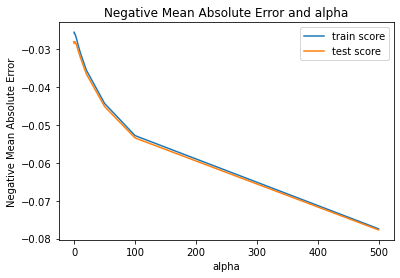

In [317]:
# plotting mean test and train scoes with alpha 

ridge_results['param_alpha'] = ridge_results['param_alpha'].astype('int32')

# plotting

plt.plot(ridge_results['param_alpha'], ridge_results['mean_train_score'])
plt.plot(ridge_results['param_alpha'], ridge_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [318]:
# Features and coefficient in a dataframe

ridge_df = pd.DataFrame({'Features':X_train_new.columns, 'Coefficient':ridge.coef_.round(4)})
ridge_df.reset_index(drop=True, inplace=True)
ridge_df

,Features,Coefficient
0,LotArea,0.0918
1,OverallQual,0.1843
2,OverallCond,0.1533
3,MasVnrArea,0.0240
4,BsmtFinSF1,0.0895
5,BsmtFinSF2,0.0119
6,BsmtUnfSF,0.0235
7,TotalBsmtSF,0.0848
8,GrLivArea,0.2839
9,BsmtFullBath,0.0169


In [319]:
# top 10 parameters from ridge
model_parameter = list(ridge.coef_)
model_parameter.insert(0,ridge.intercept_)
cols = X_train_new[ridge_df.Features]

ridge_coef = pd.DataFrame(list(zip(cols,model_parameter)))
ridge_coef.columns = ['Feaure','Coef']
ridge_coef.sort_values(by='Coef',ascending=False).head(10)

,Feaure,Coef
9,BsmtFullBath,0.283916
2,OverallCond,0.184274
3,MasVnrArea,0.153330
1,OverallQual,0.091835
5,BsmtFinSF2,0.089504
8,GrLivArea,0.084806
12,OpenPorchSF,0.076843
58,SaleCondition_AdjLand,0.056967
16,MSZoning_RH,0.051181
57,SaleType_Oth,0.045544


## Camparsion between Ridge and LASSO

In [320]:
resultTable = {'Metric':["R2 Score Train", "R2Score Test", "RSS Train", "RSS Test", "MSE Train", "MSE Test"],
               'Ridge regression':metric2}

linear_metric = pd.DataFrame()

rg_metric = pd.DataFrame(resultTable, columns=["Metric", 'Ridge regression'])

ls_metric = pd.Series(metric3, name ='Lasso regression')

final = pd.concat([rg_metric,ls_metric],axis=1)

final

,Metric,Ridge regression,Lasso regression
0,R2 Score Train,0.928618,0.932763
1,R2Score Test,0.898725,0.906227
2,RSS Train,1.476826,1.391060
3,RSS Test,0.714483,0.661552
4,MSE Train,0.001391,0.001310
5,MSE Test,0.002013,0.001864


In [321]:
# Best alpha value of Lasso : {'alpha': 0.0001}
# Best alpha value of Ridge : {'alpha': 0.9}

In [322]:
# After the observation of r2 of Linear, Ridge and Lasso on train and test set we conclude that Lasso is best to build the model.
# The optimal lamda/alpha value in case of Ridge and Lasso is:
# Ridge - 0.9
# Lasso - 0.0001
# The Mean Squared error in case of Ridge and Lasso are:
# Ridge - 0.001353
# Lasso - 0.001286 
# Top features which is significant in predicting the price of a house, based on Lasso, and how good those features describes the price of a house.
# 1] BsmtFullBath : Houses with Basement and Basement full bathrooms has significant increase in the sales price.
# 2] MSSubClass : House type has significant affect on the sales price.
# 3] MasVnrArea : Masonry veneer area of the house also has significant increase in the sales price.¶
# 4] HeatingQC : Heating quality present in the house has significant increase in the sales price.
# 5] OverallQual : If the Overall quality of house is Excellent the SalePrice is higher.
# 6] WoodDeckSF : If floor is made up of wood deck teh it will significantly affect sales price.
# 7] OverallCond : If the Overall Condition of house is Excellent the SalePrice is higher.
# 8] BsmtFinType2 : Finish quality of second basement in a House increase the sales price.


## Subjective Questions

### Question 1

What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose
double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change
is implemented?

In [323]:
ridge = Ridge(alpha=1.8)
ridge.fit(X_train_new, y_train)
print(ridge.coef_)

[ 8.83893053e-02  1.83089493e-01  1.45394303e-01  2.56099273e-02
  8.74699452e-02  1.12876217e-02  2.41546595e-02  8.36396551e-02
  2.69049366e-01  1.76611737e-02  3.51459752e-02  7.95648867e-02
  2.99113117e-02  2.50690778e-02 -1.29400534e-01  4.23792603e-02
  1.04082261e-02  3.57701161e-02  1.36275247e-02 -1.31804096e-02
 -1.52700249e-02  4.39032802e-02 -1.91826476e-02 -3.29050778e-02
 -1.19691601e-02  2.44690139e-02  4.15296475e-02 -2.37684124e-02
 -4.46006944e-02 -1.61225309e-02 -1.94014193e-02  1.47148016e-02
  2.03661449e-02  1.10589198e-02  3.38572135e-02  1.15696113e-02
 -1.36869542e-04 -3.88527886e-02  2.16162367e-02 -1.15673680e-02
 -7.19967932e-03  0.00000000e+00  2.57049549e-02 -1.36869542e-04
 -1.15673680e-02  1.68645542e-02 -1.18403358e-02 -2.85280791e-02
  1.67907555e-02  1.74040797e-02  2.65757814e-02  2.62331955e-02
 -1.57919869e-02  2.90322771e-02  1.47544150e-02  1.49648681e-02
  4.53695476e-02  4.24526756e-02  1.57350798e-02  2.43649647e-02]


In [324]:
y_pred_train = ridge.predict(X_train_new)
y_pred_test = ridge.predict(X_test_new)

metric2=[]
r2_train_lr = r2_score(y_train,y_pred_train )
print("r2_train:")
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("r2_test:")
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train-y_pred_train))
print("RSS_train:")
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("RSS_test:")
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train,y_pred_train)
print("MSE_train:")
print(mse_train_lr)
metric2.append(mse_train_lr)

mse_test_lr = mean_squared_error(y_test , y_pred_test)
print("MSE_test:")
print(mse_test_lr)
metric2.append(mse_test_lr)

r2_train:
0.9270841892410977
r2_test:
0.896682047985613
RSS_train:
1.5085494998484856
RSS_test:
0.7288929842488444
MSE_train:
0.001420479755036239
MSE_test:
0.0020532196739404067


In [325]:
ridge_df = pd.DataFrame({'Features':X_train_new.columns, 'Coefficient':ridge.coef_.round(4)})
ridge_df.reset_index(drop=True, inplace=True)
ridge_df

,Features,Coefficient
0,LotArea,0.0884
1,OverallQual,0.1831
2,OverallCond,0.1454
3,MasVnrArea,0.0256
4,BsmtFinSF1,0.0875
5,BsmtFinSF2,0.0113
6,BsmtUnfSF,0.0242
7,TotalBsmtSF,0.0836
8,GrLivArea,0.2690
9,BsmtFullBath,0.0177


In [326]:
# top 10 parameters from ridge
model_parameter = list(ridge.coef_)
model_parameter.insert(0,ridge.intercept_)
cols = X_train_new[ridge_df.Features]

ridge_coef = pd.DataFrame(list(zip(cols,model_parameter)))
ridge_coef.columns = ['Feaure','Coef']
ridge_coef.sort_values(by='Coef',ascending=False).head(10)

,Feaure,Coef
9,BsmtFullBath,0.269049
2,OverallCond,0.183089
3,MasVnrArea,0.145394
1,OverallQual,0.088389
5,BsmtFinSF2,0.087470
8,GrLivArea,0.083640
12,OpenPorchSF,0.079565
0,LotArea,0.053824
57,SaleType_Oth,0.045370
22,Neighborhood_Edwards,0.043903


In [327]:
lasso = Lasso(alpha=0.0002)
lasso.fit(X_train, y_train)
print(lasso.coef_)

[-0.01716531  0.06614888  0.17403708  0.12264782  0.00738655  0.00706021
 -0.00450072  0.00609476  0.00404932  0.00238102  0.05307461  0.00069151
  0.          0.          0.09779109  0.00750022  0.          0.28462854
  0.00618309  0.          0.01167317  0.00319749  0.0073687   0.02907785
  0.00439443  0.06440089  0.01155757  0.01837091  0.01330305  0.
  0.00458582  0.00476862 -0.08832332 -0.00836516  0.01862421  0.
  0.0216708  -0.          0.          0.         -0.          0.00668772
 -0.00567847 -0.         -0.00058992  0.         -0.          0.01140516
  0.         -0.          0.03920162 -0.01462859 -0.00244052 -0.00220363
 -0.00729024 -0.          0.00039528  0.         -0.          0.0006437
  0.01719688 -0.00215382 -0.         -0.          0.          0.00773671
  0.02969506  0.          0.         -0.          0.00942791 -0.
  0.         -0.01416398  0.          0.          0.         -0.
 -0.         -0.00292599 -0.0004054  -0.         -0.00117832 -0.
  0.          0.   

In [328]:
# R2, RSS, MSE values for test and train sets in Lasso

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3=[]
r2_train_lr = r2_score(y_train,y_pred_train )
print("r2_train:")
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("r2_test:")
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train-y_pred_train))
print("RSS_train:")
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("RSS_test:")
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train,y_pred_train)
print("MSE_train:")
print(mse_train_lr)
metric3.append(mse_train_lr)

mse_test_lr = mean_squared_error(y_test , y_pred_test)
print("MSE_test:")
print(mse_test_lr)
metric3.append(mse_test_lr)

r2_train:
0.929167403748304
r2_test:
0.9059043609682228
RSS_train:
1.4654500380141462
RSS_test:
0.6638309200043336
MSE_train:
0.001379896457640439
MSE_test:
0.0018699462535333342


In [329]:
# top 10 features
model_param = list(lasso.coef_)
model_param.insert(0,lasso.intercept_)
cols = df_train.columns
cols.insert(0,'const')
lasso_coef = pd.DataFrame(list(zip(cols,model_param)))
lasso_coef.columns = ['Featuere','Coef']
lasso_coef.sort_values(by='Coef',ascending=False).head(10)

,Featuere,Coef
18,BsmtFullBath,0.284629
3,OverallCond,0.174037
4,MasVnrArea,0.122648
15,HeatingQC,0.097791
2,OverallQual,0.066149
26,WoodDeckSF,0.064401
11,BsmtFinType2,0.053075
51,Neighborhood_Edwards,0.039202
141,SaleType_Oth,0.034120
0,MSSubClass,0.033576


In [330]:
# shortlisted Features and coefficienst in a dataframe
lasso_df = pd.DataFrame({'Features':X_train.columns, 'Coefficient':lasso.coef_.round(4)})
lasso_df = lasso_df[lasso_df['Coefficient'] != 0.00]
lasso_df.reset_index(drop=True, inplace=True)
lasso_df

,Features,Coefficient
0,MSSubClass,-0.0172
1,LotArea,0.0661
2,OverallQual,0.1740
3,OverallCond,0.1226
4,MasVnrArea,0.0074
...,...,...
60,GarageType_CarPort,-0.0004
61,GarageType_Detchd,0.0025
62,SaleType_New,0.0341
63,SaleType_WD,-0.0039


In [331]:
resultTable = {'Metric':["R2 Score Train", "R2Score Test", "RSS Train", "RSS Test", "MSE Train", "MSE Test"],
              'Ridge regression':metric2}
linear_metric = pd.DataFrame()
rg_metric = pd.DataFrame(resultTable, columns=["Metric", 'Ridge regression'])
ls_metric = pd.Series(metric3, name ='Lasso regression')
final = pd.concat([rg_metric,ls_metric],axis=1)
final

,Metric,Ridge regression,Lasso regression
0,R2 Score Train,0.927084,0.929167
1,R2Score Test,0.896682,0.905904
2,RSS Train,1.508549,1.465450
3,RSS Test,0.728893,0.663831
4,MSE Train,0.001420,0.001380
5,MSE Test,0.002053,0.001870


### Question 2

2] You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?

### Question 3

After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?


In [332]:
df_train, df_test = train_test_split(df, train_size=0.75,test_size = 0.25, random_state=100)

In [333]:
num_var=['MSSubClass', 'LotArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF', 'GrLivArea', 
         'FullBath', 'HalfBath', 'BedroomAbvGr', 'Fireplaces', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch',
         'MoSold', 'SalePrice', 'YrSold_Old', 'YearRemodAdd_Old', 'YearBuilt_Old', 'GarageYrBlt_Old']

df_train[num_var] = scaler.fit_transform(df_train[num_var])
df_test[num_var] = scaler.transform(df_test[num_var])
df_train.head()

,MSSubClass,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtExposure,BsmtFinType1,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
933,0.000000,0.231407,7,5,210.0,3,2,4,3,6,...,0,0,0,0,1,0,0,0,1,0
1174,0.294118,0.497904,6,8,0.0,2,2,4,1,3,...,0,0,0,0,1,0,0,0,1,0
365,0.294118,0.304130,5,7,0.0,2,3,3,1,3,...,0,0,0,0,1,0,0,0,1,0
480,0.000000,0.480507,9,5,378.0,3,2,5,4,6,...,0,0,0,0,1,0,0,0,1,0
1450,0.411765,0.248341,5,5,0.0,2,2,4,1,1,...,0,0,0,0,1,0,0,0,1,0


In [334]:
lm = LinearRegression()
lm.fit(X_train, y_train)

# Running RFE with the output number of the variable 50
rfe = RFE(lm,n_features_to_select=60)            
rfe = rfe.fit(X_train, y_train)

In [335]:
col = X_train.columns[rfe.support_]

temp1 = pd.DataFrame(list(zip(X_train.columns,rfe.support_,rfe.ranking_)), columns=['Variable', 'rfe_support', 'rfe_ranking'])
temp1 = temp1.loc[temp1['rfe_support'] == True]
temp1.reset_index(drop=True, inplace=True)
temp1

,Variable,rfe_support,rfe_ranking
0,LotArea,True,1
1,OverallQual,True,1
2,OverallCond,True,1
3,MasVnrArea,True,1
4,BsmtFinSF1,True,1
5,BsmtFinSF2,True,1
6,BsmtUnfSF,True,1
7,TotalBsmtSF,True,1
8,GrLivArea,True,1
9,BsmtFullBath,True,1


In [336]:
# Assign the 60 columns to X_train_rfe

X_train_rfe = X_train[col]

X_train = X_train_rfe[X_train_rfe.columns]
X_test =  X_test[X_train.columns]

In [337]:
lasso = Lasso(alpha=0.0001)
lasso.fit(X_train, y_train)

Lasso(alpha=0.0001)

In [338]:
# R2, RSS, MSE values for test and train sets in Lasso

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3=[]
r2_train_lr = r2_score(y_train,y_pred_train )
print("r2_train:")
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("r2_test:")
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train-y_pred_train))
print("RSS_train:")
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("RSS_test:")
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train,y_pred_train)
print("MSE_train:")
print(mse_train_lr)
metric3.append(mse_train_lr)

mse_test_lr = mean_squared_error(y_test , y_pred_test)
print("MSE_test:")
print(mse_test_lr)
metric3.append(mse_test_lr)

r2_train:
0.9255783147032718
r2_test:
0.9003233719294955
RSS_train:
1.5397044202591386
RSS_test:
0.7032039783759472
MSE_train:
0.0014498158382854412
MSE_test:
0.001980856277115344


In [339]:
# printing top 5 features
model_param = list(lasso.coef_)
model_param.insert(0,lasso.intercept_)
cols = df_train.columns
cols.insert(0,'const')
lasso_coef = pd.DataFrame(list(zip(cols,model_param)))
lasso_coef.columns = ['Featuere','Coef']
lasso_coef.sort_values(by='Coef',ascending=False).head(5)

,Featuere,Coef
9,BsmtFinType1,0.299275
2,OverallQual,0.199957
3,OverallCond,0.157322
8,BsmtExposure,0.116876
0,MSSubClass,0.084041


### Question 4

How can you make sure that a model is robust and generalisable? What are the implications of the same for the accuracy of the model and why?